# Install TensorFlow Object Detection Dependencies

This uninstalls Cython, which may cause issues in Colab, and then clones the TensorFlow Models repository. The repository contains the official models used in TensorFlow for various tasks such as object detection, image classification, and more.

In [1]:
# Uninstall Cython to avoid conflicts in Colab
!pip uninstall Cython -y

# Clone the TensorFlow Models repository with a shallow clone to reduce download size
!git clone --depth 1 https://github.com/tensorflow/models

Found existing installation: Cython 3.0.11
Uninstalling Cython-3.0.11:
  Successfully uninstalled Cython-3.0.11
Cloning into 'models'...
remote: Enumerating objects: 4245, done.
remote: Counting objects: 100% (4245/4245), done.
remote: Compressing objects: 100% (3238/3238), done.
remote: Total 4245 (delta 1192), reused 2134 (delta 936), pack-reused 0 (from 0)
Receiving objects: 100% (4245/4245), 48.86 MiB | 11.06 MiB/s, done.
Resolving deltas: 100% (1192/1192), done.
Updating files: 100% (3824/3824), done.


This compiles the protocol buffers (.proto files) used in TensorFlow's Object Detection API, generating the necessary Python files for further use.

In [2]:
%%bash

# Navigate to the 'models/research/' directory
cd models/research/

# Compile all .proto files in the 'object_detection/protos' directory into Python files
protoc object_detection/protos/*.proto --python_out=.
#cp object_detection/packages/tf2/setup.py .

This modifies the setup.py file to specify that the tf-models-official package should be installed at version 2.8.0, which is compatible with TensorFlow v2.8.0.

In [3]:
# Import the regular expressions module
import re

# Open the 'setup.py' file located at '/content/models/research/object_detection/packages/tf2/' for reading
with open('/content/models/research/object_detection/packages/tf2/setup.py') as f:
    s = f.read()  # Read the file content into the variable 's'

# Open the 'setup.py' file located at '/content/models/research/' for writing
with open('/content/models/research/setup.py', 'w') as f:
    # Replace 'tf-models-official>=2.5.1' with 'tf-models-official==2.8.0' in the content
    s = re.sub('tf-models-official>=2.5.1', 'tf-models-official==2.8.0', s)
    f.write(s)  # Write the modified content back to the file

This installs the TensorFlow Object Detection API and its dependencies in Colab. It includes workarounds for version compatibility issues and sets up CUDA 11.0 to ensure compatibility with TensorFlow v2.8.0.

In [4]:
# Install PyYAML version 5.3 as a temporary fix (Colab cannot install PyYAML v5.4.1)
!pip install pyyaml==5.3

# Install the TensorFlow Object Detection API from the local path
!pip install /content/models/research/

# Downgrade TensorFlow to version 2.8.0 due to compatibility issues with TF v2.10
!pip install tensorflow==2.8.0

# Install TensorFlow I/O, which is required for TensorFlow 2.8.0
!pip install tensorflow_io==0.23.1

# Download and set up CUDA 11.0 to maintain compatibility with TensorFlow v2.8.0
!wget https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/cuda-ubuntu1804.pin
!mv cuda-ubuntu1804.pin /etc/apt/preferences.d/cuda-repository-pin-600
!wget http://developer.download.nvidia.com/compute/cuda/11.0.2/local_installers/cuda-repo-ubuntu1804-11-0-local_11.0.2-450.51.05-1_amd64.deb
!dpkg -i cuda-repo-ubuntu1804-11-0-local_11.0.2-450.51.05-1_amd64.deb
!apt-key add /var/cuda-repo-ubuntu1804-11-0-local/7fa2af80.pub
!apt-get update && sudo apt-get install cuda-toolkit-11-0

# Export the CUDA library path to ensure it's used by TensorFlow
!export LD_LIBRARY_PATH=/usr/local/cuda-11.0/lib64:$LD_LIBRARY_PATH

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.2/268.2 kB 7.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.3-cp310-cp310-linux_x86_64.whl size=44245 sha256=4f5e37057f1de155c2cd34ff47196604eba1eb00211538d03d94b790d1b6100d
  Stored in directory: /root/.cache/pip/wheels/0d/72/68/a263cfc14175636cf26bada99f13b735be1b60a11318e08bfc
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.2
    Uninstalling PyYAML-6.0.2:
      Successfully uninstalled PyYAML-6.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2024.7.1 requires pyyaml>=5.3.1, but you have pyyaml 5.3 which is incompatible.
distributed 2024.7.1 requires pyyaml>=5.3.1, but you have pyyaml 5.3 which is incompatible.
flax 0.8.4 requires PyYAML>=5.4.1, but you have pyyaml 5.3 which is incompatible

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 497.6/497.6 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.5/462.5 kB 27.8 MB/s eta 0:00:00
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.8.1
    Uninstalling tensorflow-2.8.1:
      Successfully uninstalled tensorflow-2.8.1
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.1/23.1 MB 85.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 36.2 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-io-gcs-filesystem
    Found existing installation: tensorflow-io-gcs-filesystem 0.37.1
    Uninstalling tensorflow-io-gcs-filesystem-0.37.1:
      Successfully uninstalled tensorflow-io-gcs-filesystem-0.37.1
  Attempting uninstall: tensorflow_io
    Found existing installation: tensorflow-io 0.37.1
    Uninstalling tensorflow-io-0.37.1:
      Successfully uninstalled tensorflow-io-0.37.1
--2024-08-15 19:58:26--  https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1

This runs a test script for the Object Detection API's model builder to verify that everything is set up correctly and working as expected.

In [5]:
# Execute the model builder test script to ensure proper installation and functionality
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

Running tests under Python 3.10.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2024-08-15 20:02:37.246663: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0815 20:02:37.826098 132737963732992 model_builder.py:1112] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 4.14s
I0815 20:02:38.225831 132737963732992 test_util.py:2373] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 4.14s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 0.8s
I0815 20:02:39.031515 132737963732992 test

# Uploading Image Dataset and Prepare Training Data

This mounts Google Drive in Colab and copies the dataset file (images.zip) from Google Drive to the Colab environment for further use.

In [6]:
# Mount Google Drive to access files stored there
from google.colab import drive
drive.mount('/content/gdrive')

# Copy 'images.zip' from Google Drive to the Colab environment
!cp /content/gdrive/MyDrive/rtslat/images/images.zip /content

Mounted at /content/gdrive


This creates directories for organizing image data and extracts the contents of images.zip into a specific folder structure within the Colab environment.

In [7]:
# Create a directory to store the extracted images
!mkdir /content/images

# Unzip 'images.zip' into the 'all' subdirectory within '/content/images'
!unzip -q images.zip -d /content/images/all

# Create subdirectories for organizing images into training, validation, and test sets
!mkdir /content/images/train
!mkdir /content/images/validation
!mkdir /content/images/test

This downloads a Python script for splitting image data into training, validation, and test sets, and then executes the script to perform the split.

In [8]:
# Download the script for splitting image data into train, validation, and test sets
!wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/train_val_test_split.py

# Run the downloaded script to split the images into train, validation, and test sets
!python train_val_test_split.py

--2024-08-15 20:03:46--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/train_val_test_split.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3100 (3.0K) [text/plain]
Saving to: ‘train_val_test_split.py’

train_val_test_spli 100%[===================>]   3.03K  --.-KB/s    in 0s      

2024-08-15 20:03:46 (49.7 MB/s) - ‘train_val_test_split.py’ saved [3100/3100]

Total images: 286
Images moving to train: 228
Images moving to validation: 28
Images moving to test: 30


This creates a labelmap.txt file and writes the list of sign gestures in the dataset.

In [9]:
%%bash
cat <<EOF >> /content/labelmap.txt
hello
iloveyou
mute
no
sign
talk
thankyou
use
voice
yes
EOF

This downloads Python scripts for converting annotated data into CSV and TFRecord formats, which are required for training the object detection model.

In [10]:
# Download the 'create_csv.py' script, which converts annotated data into a CSV file
!wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_csv.py

# Download the 'create_tfrecord.py' script, which converts annotated data into a TFRecord file
!wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_tfrecord.py

--2024-08-15 20:03:47--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_csv.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1348 (1.3K) [text/plain]
Saving to: ‘create_csv.py’

create_csv.py       100%[===================>]   1.32K  --.-KB/s    in 0s      

2024-08-15 20:03:47 (89.3 MB/s) - ‘create_csv.py’ saved [1348/1348]

--2024-08-15 20:03:47--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_tfrecord.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githu

This runs scripts to create CSV data files and convert them into TFRecord files, which are used to train and validate the object detection model.

In [11]:
# Run the 'create_csv.py' script to generate CSV files from the annotated data
!python3 create_csv.py

# Generate a TFRecord file for the training data using the corresponding CSV and label map
!python3 create_tfrecord.py --csv_input=images/train_labels.csv --labelmap=labelmap.txt --image_dir=images/train --output_path=train.tfrecord

# Generate a TFRecord file for the validation data using the corresponding CSV and label map
!python3 create_tfrecord.py --csv_input=images/validation_labels.csv --labelmap=labelmap.txt --image_dir=images/validation --output_path=val.tfrecord

Successfully converted xml to csv.
Successfully converted xml to csv.
Successfully created the TFRecords: /content/train.tfrecord
Successfully created the TFRecords: /content/val.tfrecord


# Setting Up Training Configuration

This sets up the file paths for the training TFRecord, validation TFRecord, and the label map file used later in the object detection model training process.

In [12]:
# Define the file path for the training TFRecord file
train_record_fname = '/content/train.tfrecord'

# Define the file path for the validation TFRecord file
val_record_fname = '/content/val.tfrecord'

# Define the file path for the label map file in .pbtxt format
label_map_pbtxt_fname = '/content/labelmap.pbtxt'

This configures the ssd-mobilenet-v2-fpnlite-320 model from TensorFlow's object detection model zoo. The necessary configuration details are extracted for this specific model.

In [13]:
# Specify the model to deploy
chosen_model = 'ssd-mobilenet-v2-fpnlite-320'

# Configuration details for the 'ssd-mobilenet-v2-fpnlite-320' model
MODELS_CONFIG = {
    'ssd-mobilenet-v2-fpnlite-320': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz',
    }
}

# Extract the configuration details for the chosen model
model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']

This sets up a directory to hold the pre-trained model weights and configuration files, downloads the necessary files, and extracts the model weights for further use in training.

In [14]:
# Create a directory to store the pre-trained model weights and configuration files
%mkdir /content/models/mymodel/
%cd /content/models/mymodel/

# Download the pre-trained model weights as a tar file
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
!wget {download_tar}

# Extract the contents of the downloaded tar file
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

# Download the training configuration file for the chosen model
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/models/mymodel
--2024-08-15 20:03:57--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.197.207, 74.125.135.207, 74.125.142.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.197.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  --.-KB/s    in 0.1s    

2024-08-15 20:03:57 (136 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]

--2024-08-15 20:03:57--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.19

This sets the training parameters for the selected object detection model (ssd-mobilenet-v2-fpnlite-320). The number of training steps and batch size are configured accordingly.

In [15]:
# Set the total number of training steps to 61,000
num_steps = 61000

# Set the batch size to 16 for the chosen model 'ssd-mobilenet-v2-fpnlite-320'
batch_size = 16

This sets the file paths for the training pipeline configuration and fine-tuning checkpoint, then defines a function to determine the number of classes in the label map file. The total number of classes is printed for verification.

In [16]:
# Set the file path for the pipeline configuration file
pipeline_fname = '/content/models/mymodel/' + base_pipeline_file

# Set the file path for the fine-tuning checkpoint
fine_tune_checkpoint = '/content/models/mymodel/' + model_name + '/checkpoint/ckpt-0'

# Function to calculate the number of classes based on the label map file
def get_num_classes(pbtxt_fname):
    # Import the label map utility from the object detection library
    from object_detection.utils import label_map_util

    # Load the label map from the given .pbtxt file
    label_map = label_map_util.load_labelmap(pbtxt_fname)

    # Convert the label map to a list of categories
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)

    # Create a dictionary mapping category IDs to category names
    category_index = label_map_util.create_category_index(categories)

    # Return the number of unique classes in the label map
    return len(category_index.keys())

# Get the total number of classes from the label map file
num_classes = get_num_classes(label_map_pbtxt_fname)

# Print the total number of classes
print('Total classes:', num_classes)

Total classes: 10


This creates a custom configuration file by modifying the base pipeline configuration file.

In [17]:
# Import the 're' module for regular expression operations
import re

# Change the current directory to where the custom model files are located
%cd /content/models/mymodel

# Indicate that the custom configuration file is being written
print('writing custom configuration file')

# Read the base pipeline configuration file into a string
with open(pipeline_fname) as f:
    s = f.read()

# Open a new file to write the modified configuration
with open('pipeline_file.config', 'w') as f:

    # Update the fine-tune checkpoint path in the configuration file
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    # Update the path for the training TFRecord file
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)

    # Update the path for the validation TFRecord file
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(val_record_fname), s)

    # Update the path for the label map file
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Update the batch size in the configuration file
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Update the number of training steps in the configuration file
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    # Update the number of classes in the configuration file
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    # Change the fine-tune checkpoint type from "classification" to "detection"
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    # If the chosen model is 'ssd-mobilenet-v2', adjust the learning rate to a lower value
    if chosen_model == 'ssd-mobilenet-v2':
      s = re.sub('learning_rate_base: .8',
                 'learning_rate_base: .08', s)

      s = re.sub('warmup_learning_rate: 0.13333',
                 'warmup_learning_rate: .026666', s)

    # If the chosen model was 'efficientdet-d0', replace the resizer with one compatible with TFLite (not applicable here)
    # s = re.sub('keep_aspect_ratio_resizer', 'fixed_shape_resizer', s)
    # s = re.sub('pad_to_max_dimension: true', '', s)
    # s = re.sub('min_dimension', 'height', s)
    # s = re.sub('max_dimension', 'width', s)

    # Write the modified configuration to the new file
    f.write(s)

/content/models/mymodel
writing custom configuration file


This sets the paths for the custom configuration file and the directory where training checkpoints will be stored.

In [18]:
# Define the path to the custom pipeline configuration file
pipeline_file = '/content/models/mymodel/pipeline_file.config'

# Define the directory where training checkpoints will be saved
model_dir = '/content/training/'

# Training Custom TFLite Detection Model

This loads and starts the TensorBoard, pointing it to the directory where the training logs are stored.

In [19]:
# Load the TensorBoard extension to visualize training progress
%load_ext tensorboard

# Start TensorBoard and specify the directory containing the training logs
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

This runs the TensorFlow 2 object detection model training using the custom configuration file. It sets the training parameters, logs progress, and directs output to the console.

In [20]:
# Start training the object detection model using the custom configuration file
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.13.0 and strictly below 2.16.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.8.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're us

# Converting Model to TensorFlow Lite

This prepares the environment for exporting the trained TensorFlow model to TensorFlow Lite (TFLite) format. It creates a directory to store the TFLite model and runs the export script.

In [21]:
# Create a directory to store the converted TFLite model
!mkdir /content/custom_model_lite

# Set the output directory for the TFLite model
output_directory = '/content/custom_model_lite'

# Path to the directory containing the training checkpoints
last_model_path = '/content/training'

# Export the trained model to TFLite format
!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}

2024-08-15 20:58:25.790935: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0815 20:58:31.807814 139346511708160 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
I0815 20:58:38.410979 139346511708160 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
2024-08-15 20:58:40.194862: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.
I0815 20:58:40.807308 139346511708160 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
W0815 20:58:42.051492 139346511708160 save_impl.py:71] Skipping full serialization of Keras layer <object_detection.meta_architectures.ssd_meta_arch.SSDMetaArch object at 0x7ebbaf40ab30>, because it is not built.
W0815 20:58:42.292269

This snippet converts the exported TensorFlow model into TensorFlow Lite (TFLite) format. It saves the TFLite model file for deployment on edge devices or mobile platforms.

In [22]:
# Import TensorFlow library
import tensorflow as tf

# Create a TFLite converter from the saved TensorFlow model
converter = tf.lite.TFLiteConverter.from_saved_model('/content/custom_model_lite/saved_model')

# Convert the TensorFlow model to TFLite format
tflite_model = converter.convert()

# Save the TFLite model to a file
with open('/content/custom_model_lite/detect.tflite', 'wb') as f:
  f.write(tflite_model)

# Testing the TensorFlow Lite Model and Calculating mAP

This runs Custom TFLite Model on Test Images for Object Detection

In [24]:
# Import necessary packages
import os  # Operating system interface
import cv2  # OpenCV for image processing
import numpy as np  # NumPy for array operations
import sys  # System-specific parameters and functions
import glob  # Unix style pathname pattern expansion
import random  # Generate random numbers
import importlib.util  # Importing modules dynamically
from tensorflow.lite.python.interpreter import Interpreter  # TensorFlow Lite interpreter

import matplotlib  # Plotting library
import matplotlib.pyplot as plt  # Matplotlib for plotting

# Display plots inline within the notebook
%matplotlib inline

# Define a function for inferencing with the TFLite model and displaying results
def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

    # Grab filenames of all images in the test folder
    images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

    # Load the label map into memory
    with open(lblpath, 'r') as f:
        labels = [line.strip() for line in f.readlines()]

    # Load the TensorFlow Lite model into memory
    interpreter = Interpreter(model_path=modelpath)
    interpreter.allocate_tensors()  # Allocate memory for model

    # Get model details
    input_details = interpreter.get_input_details()  # Input details of the model
    output_details = interpreter.get_output_details()  # Output details of the model
    height = input_details[0]['shape'][1]  # Height of the input tensor
    width = input_details[0]['shape'][2]  # Width of the input tensor

    float_input = (input_details[0]['dtype'] == np.float32)  # Check if the model expects float32 input

    input_mean = 127.5  # Mean for input normalization
    input_std = 127.5  # Standard deviation for input normalization

    # Randomly select test images
    images_to_test = random.sample(images, num_test_images)

    # Loop over every image and perform detection
    for image_path in images_to_test:

        # Load image and resize to expected shape [1xHxWx3]
        image = cv2.imread(image_path)  # Read the image
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert image to RGB
        imH, imW, _ = image.shape  # Get the image dimensions
        image_resized = cv2.resize(image_rgb, (width, height))  # Resize the image
        input_data = np.expand_dims(image_resized, axis=0)  # Add batch dimension

        # Normalize pixel values if using a floating model (i.e., if the model is non-quantized)
        if float_input:
            input_data = (np.float32(input_data) - input_mean) / input_std  # Normalize the image data

        # Perform the actual detection by running the model with the image as input
        interpreter.set_tensor(input_details[0]['index'], input_data)  # Set the input tensor
        interpreter.invoke()  # Run inference

        # Retrieve detection results
        boxes = interpreter.get_tensor(output_details[1]['index'])[0]  # Bounding box coordinates of detected objects
        classes = interpreter.get_tensor(output_details[3]['index'])[0]  # Class index of detected objects
        scores = interpreter.get_tensor(output_details[0]['index'])[0]  # Confidence of detected objects

        detections = []

        # Loop over all detections and draw detection box if confidence is above minimum threshold
        for i in range(len(scores)):
            if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

                # Get bounding box coordinates and draw box
                ymin = int(max(1, (boxes[i][0] * imH)))  # Top left y-coordinate
                xmin = int(max(1, (boxes[i][1] * imW)))  # Top left x-coordinate
                ymax = int(min(imH, (boxes[i][2] * imH)))  # Bottom right y-coordinate
                xmax = int(min(imW, (boxes[i][3] * imW)))  # Bottom right x-coordinate

                cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (10, 255, 0), 2)  # Draw bounding box

                # Draw label
                object_name = labels[int(classes[i])]  # Look up object name from labels array using class index
                label = '%s: %d%%' % (object_name, int(scores[i] * 100))  # Create label with object name and confidence
                labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)  # Get label size
                label_ymin = max(ymin, labelSize[1] + 10)  # Adjust label position
                cv2.rectangle(image, (xmin, label_ymin - labelSize[1] - 10), (xmin + labelSize[0], label_ymin + baseLine - 10), (255, 255, 255), cv2.FILLED)  # Draw white box behind label
                cv2.putText(image, label, (xmin, label_ymin - 7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2)  # Draw label text

                detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])  # Store detection details

        # Display the image with detection results
        if txt_only == False:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert image back to RGB
            plt.figure(figsize=(12, 16))  # Set figure size
            plt.imshow(image)  # Display the image
            plt.show()  # Show the plot

        # Save detection results in .txt files (for calculating mAP)
        elif txt_only == True:

            # Get filenames and paths
            image_fn = os.path.basename(image_path)  # Get image file name
            base_fn, ext = os.path.splitext(image_fn)  # Split filename and extension
            txt_result_fn = base_fn + '.txt'  # Create text file name
            txt_savepath = os.path.join(savepath, txt_result_fn)  # Create path to save text file

            # Write results to text file
            with open(txt_savepath, 'w') as f:
                for detection in detections:
                    f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))  # Write detection details

    return  # End of function

This sets up variables and run inference with Custom TFLite Model

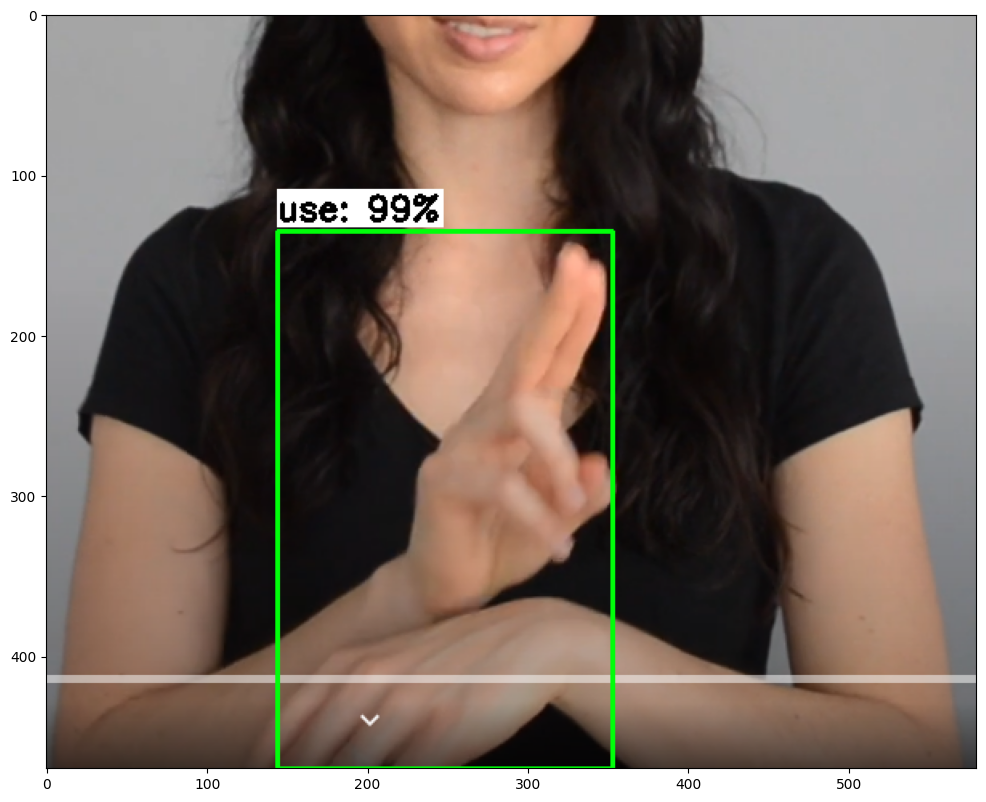

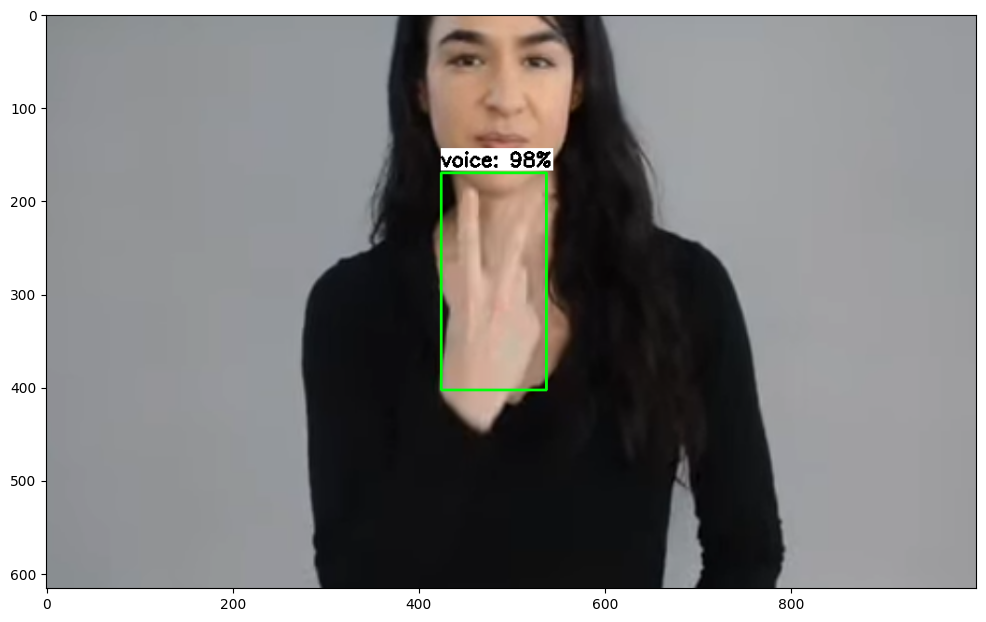

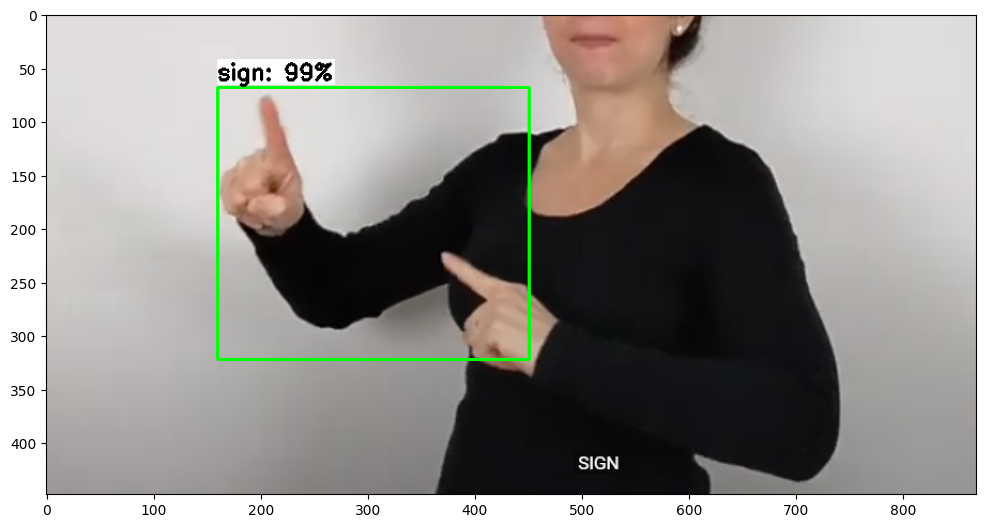

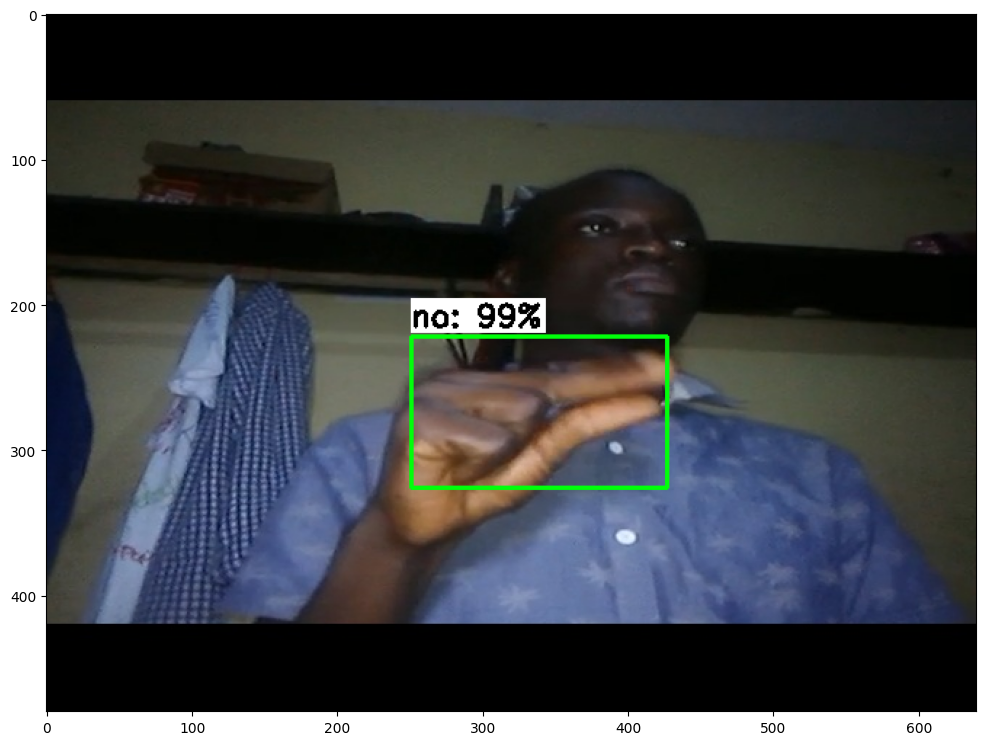

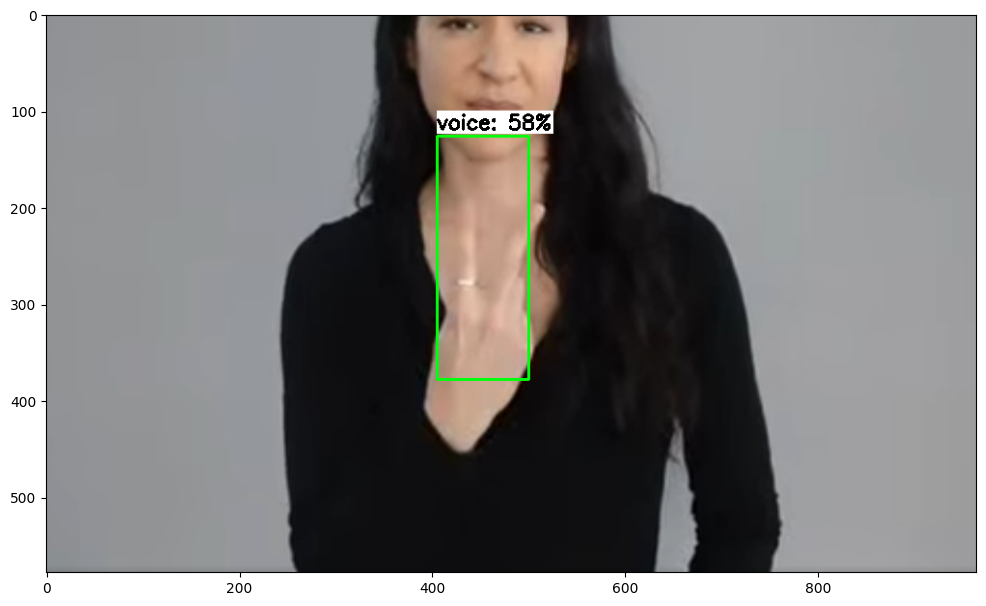

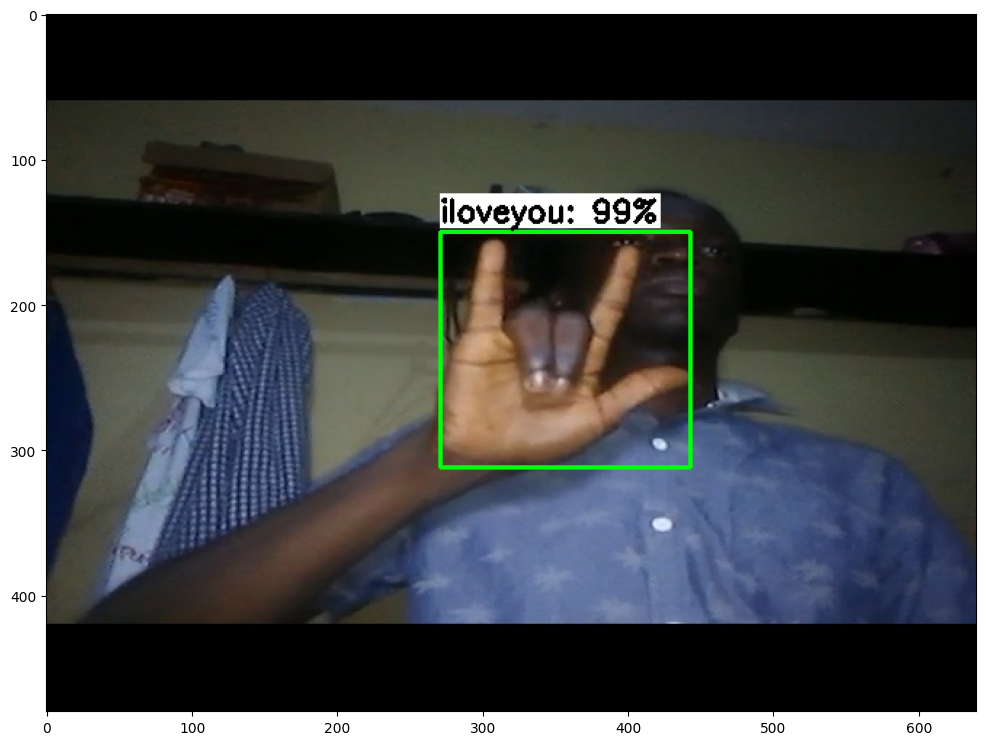

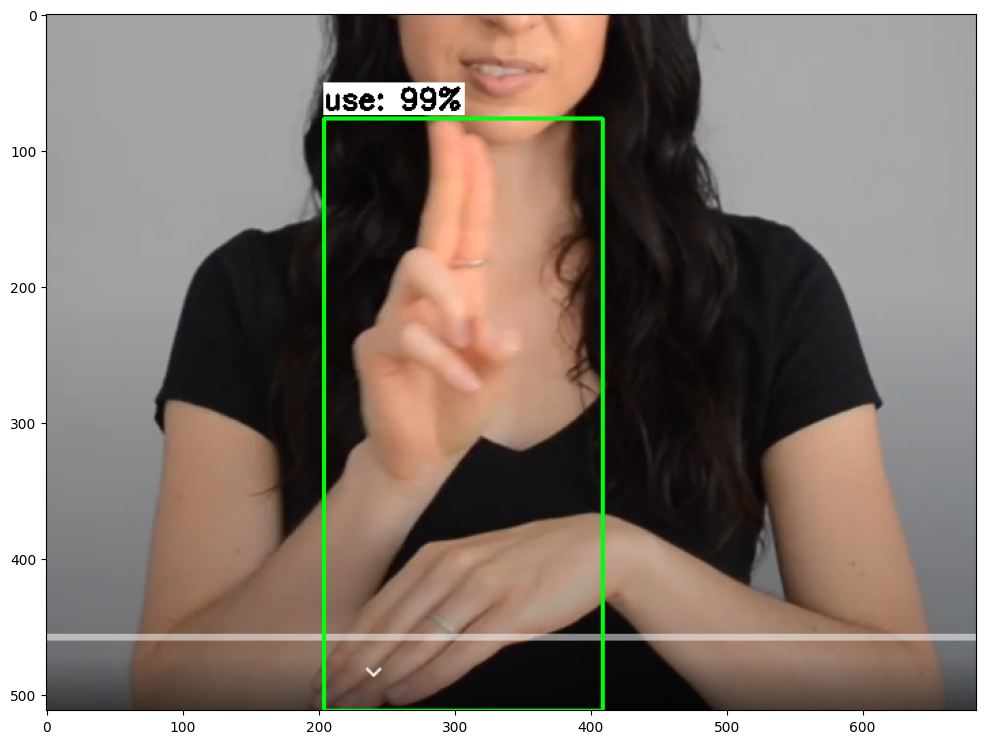

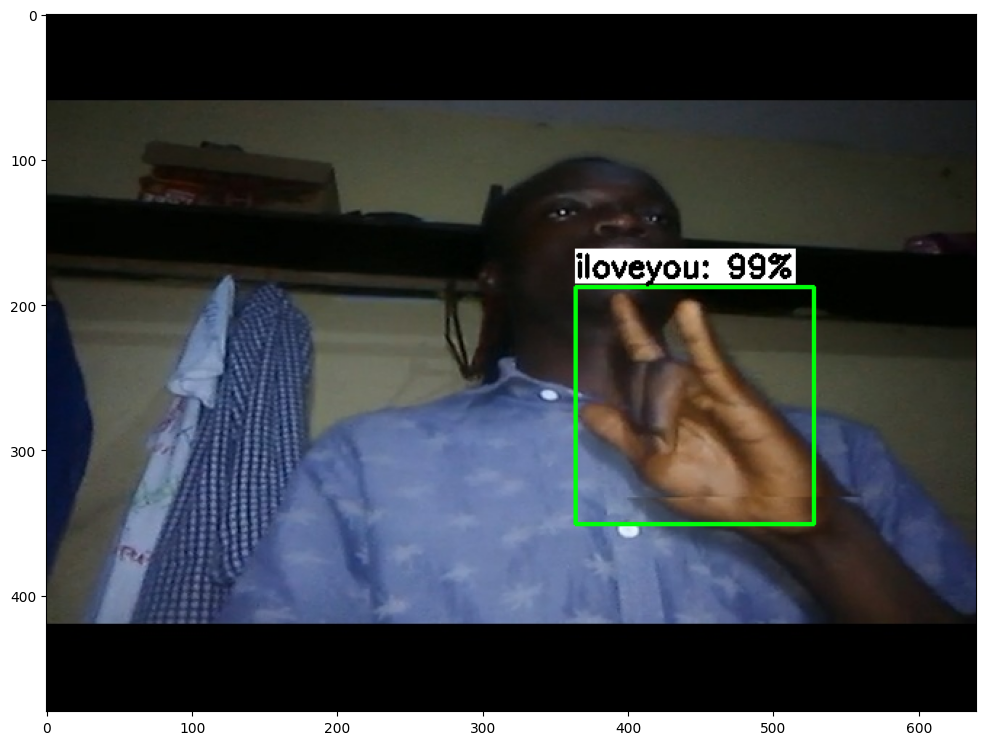

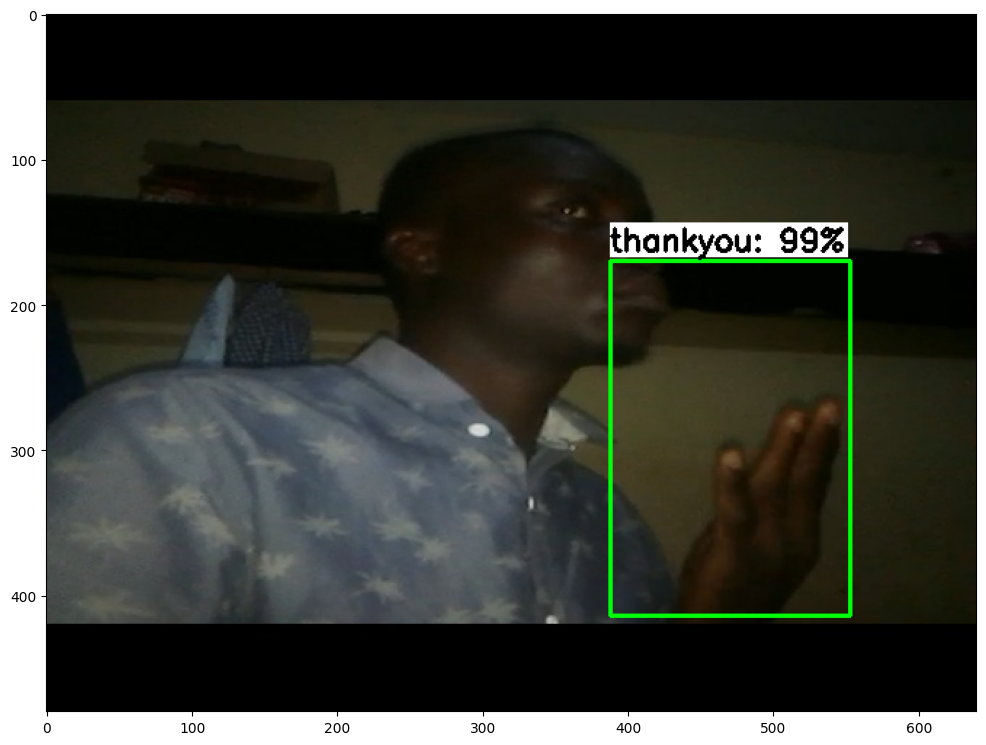

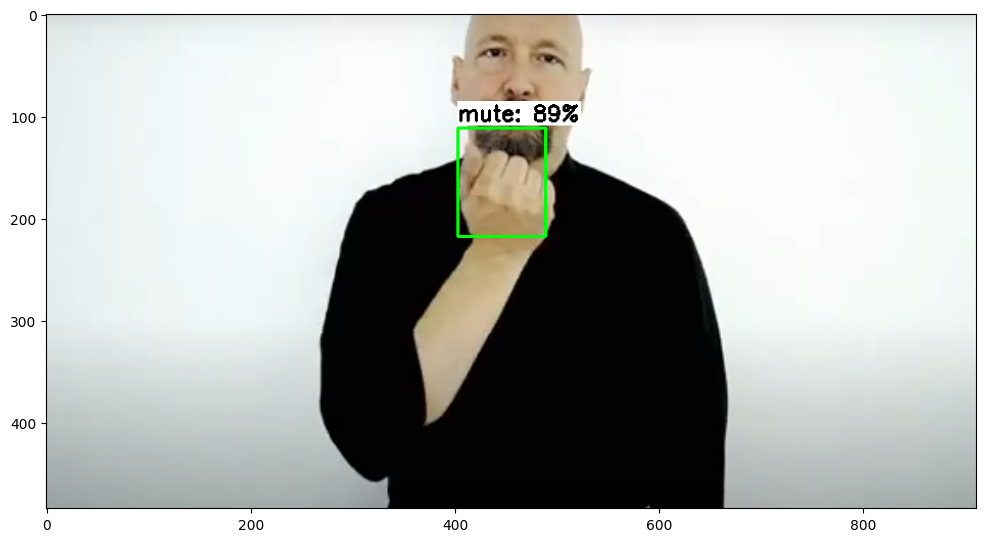

In [25]:
# Set up paths and parameters for testing
PATH_TO_IMAGES = '/content/images/test'  # Path to the folder containing test images
PATH_TO_MODEL = '/content/custom_model_lite/detect.tflite'  # Path to the TFLite model file
PATH_TO_LABELS = '/content/labelmap.txt'  # Path to the label map file
min_conf_threshold = 0.5  # Minimum confidence threshold for displaying detected objects
images_to_test = 10  # Number of images to run detection on

# Run the object detection function with the specified parameters
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

This Clones the mAP Repository and Prepares it for mAP Calculation

In [26]:
%%bash
git clone https://github.com/Cartucho/mAP /content/mAP  # Clone the mAP repository into the /content/mAP directory
cd /content/mAP  # Change the current directory to the cloned mAP directory
rm input/detection-results/*  # Remove all files from the detection-results directory to start fresh
rm input/ground-truth/*  # Remove all files from the ground-truth directory to start fresh
rm input/images-optional/*  # Remove all files from the images-optional directory
wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py  # Download a custom script for calculating mAP

Cloning into '/content/mAP'...
--2024-08-15 21:03:09--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5397 (5.3K) [text/plain]
Saving to: ‘calculate_map_cartucho.py’

     0K .....                                                 100% 46.1M=0s

2024-08-15 21:03:09 (46.1 MB/s) - ‘calculate_map_cartucho.py’ saved [5397/5397]



This Copies Test Images and XML Files for mAP Calculation

In [27]:
!cp /content/images/test/* /content/mAP/input/images-optional  # Copy all files (images and XML) from the test folder to the images-optional folder in the mAP directory
!mv /content/mAP/input/images-optional/*.xml /content/mAP/input/ground-truth/  # Move all XML files from the images-optional folder to the ground-truth folder

This Converts Ground Truth XML Files to Required Format for mAP Calculation

In [28]:
!python /content/mAP/scripts/extra/convert_gt_xml.py  # Run the script to convert XML ground truth files into the required format for mAP calculation

Conversion completed!


This section sets up the necessary variables for running inference on test images using a TensorFlow Lite model. The detection results are saved as .txt files in the specified folder.

In [29]:
PATH_TO_IMAGES='/content/images/test'   # Path to the folder containing test images
PATH_TO_MODEL='/content/custom_model_lite/detect.tflite'   # Path to the TensorFlow Lite model file
PATH_TO_LABELS='/content/labelmap.txt'   # Path to the label map file
PATH_TO_RESULTS='/content/mAP/input/detection-results' # Path to the folder where detection results will be saved
min_conf_threshold=0.1   # Set the confidence threshold for detections

# Generate a list of all image files in the test folder
image_list = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')

# Use up to 500 images for testing, or fewer if there are less than 500 images
images_to_test = min(500, len(image_list))

txt_only = True   # Set to True to save detection results in .txt files without displaying images

# Start the inference process on the selected images
print('Starting inference on %d images...' % images_to_test)

# Run the inferencing function to detect objects and save the results
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test, PATH_TO_RESULTS, txt_only)

# Print a message indicating that inferencing is complete
print('Finished inferencing!')

Starting inference on 30 images...
Finished inferencing!


This changes the directory and runs a script to calculate the mean average precision (mAP) using the detection results generated earlier. The labels for the objects detected are specified in a label map file.

In [34]:
# Change the working directory to the /content/mAP folder
%cd /content/mAP
# Run the script to calculate mAP using the specified label map file
!python calculate_map_cartucho.py --labels=/content/labelmap.txt

/content/mAP
Calculating mAP at 0.50 IoU threshold...
100.00% = hello AP 
100.00% = iloveyou AP 
75.00% = mute AP 
100.00% = no AP 
100.00% = sign AP 
100.00% = talk AP 
100.00% = thankyou AP 
95.00% = use AP 
100.00% = voice AP 
100.00% = yes AP 
mAP = 97.00%
Calculating mAP at 0.55 IoU threshold...
100.00% = hello AP 
100.00% = iloveyou AP 
75.00% = mute AP 
100.00% = no AP 
100.00% = sign AP 
100.00% = talk AP 
100.00% = thankyou AP 
95.00% = use AP 
100.00% = voice AP 
100.00% = yes AP 
mAP = 97.00%
Calculating mAP at 0.60 IoU threshold...
100.00% = hello AP 
100.00% = iloveyou AP 
75.00% = mute AP 
100.00% = no AP 
100.00% = sign AP 
100.00% = talk AP 
100.00% = thankyou AP 
95.00% = use AP 
100.00% = voice AP 
100.00% = yes AP 
mAP = 97.00%
Calculating mAP at 0.65 IoU threshold...
100.00% = hello AP 
100.00% = iloveyou AP 
50.00% = mute AP 
100.00% = no AP 
100.00% = sign AP 
100.00% = talk AP 
100.00% = thankyou AP 
95.00% = use AP 
100.00% = voice AP 
100.00% = yes AP 
mAP = 94

# Deploying TensorFlow Lite Model

This copies the necessary label map and pipeline configuration files into the TFLite model directory and then compresses the entire directory into a zip file for easy download or sharing.

In [36]:
# Copy the label map text file to the TFLite model directory
!cp /content/labelmap.txt /content/custom_model_lite
# Copy the label map protobuf file to the TFLite model directory
!cp /content/labelmap.pbtxt /content/custom_model_lite
# Copy the pipeline configuration file to the TFLite model directory
!cp /content/models/mymodel/pipeline_file.config /content/custom_model_lite

# Change the current working directory to /content
%cd /content
# Create a zip archive of the custom_model_lite directory and name it custom_model_lite.zip
!zip -r custom_model_lite.zip custom_model_lite

/content
  adding: custom_model_lite/ (stored 0%)
  adding: custom_model_lite/labelmap.txt (deflated 7%)
  adding: custom_model_lite/detect.tflite (deflated 9%)
  adding: custom_model_lite/labelmap.pbtxt (deflated 66%)
  adding: custom_model_lite/pipeline_file.config (deflated 65%)
  adding: custom_model_lite/saved_model/ (stored 0%)
  adding: custom_model_lite/saved_model/saved_model.pb (deflated 91%)
  adding: custom_model_lite/saved_model/assets/ (stored 0%)
  adding: custom_model_lite/saved_model/variables/ (stored 0%)
  adding: custom_model_lite/saved_model/variables/variables.data-00000-of-00001 (deflated 9%)
  adding: custom_model_lite/saved_model/variables/variables.index (deflated 78%)


This uses the Google Colab files module to download the zipped TFLite model archive directly to your local machine.

In [37]:
from google.colab import files   # Import the files module from Google Colab
files.download('/content/custom_model_lite.zip')   # Download the custom_model_lite.zip file to your local machine

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>